In [4]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
import plotly.express as px
import seaborn as sns
import geopy
import warnings
warnings.filterwarnings("ignore")
import folium

In [5]:
terrorism=pd.read_csv('C:/Users/user/Desktop/Assignment for classes/terrorismData.csv')
terrorism.head()

,Year,Month,Day,Country,State,Region,City,Latitude,Longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type
0,1970,7,2,Dominican Republic,NaN,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown
1,1970,0,0,Mexico,Federal,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown
2,1970,1,0,Philippines,Tarlac,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown
3,1970,1,0,Greece,Attica,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives
4,1970,1,0,Japan,Fukouka,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary


In [3]:
terrorism.shape

(181691, 17)

In [4]:
terrorism.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 17 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Year         181691 non-null  int64  
 1   Month        181691 non-null  int64  
 2   Day          181691 non-null  int64  
 3   Country      181691 non-null  object 
 4   State        181270 non-null  object 
 5   Region       181691 non-null  object 
 6   City         181256 non-null  object 
 7   Latitude     177135 non-null  float64
 8   Longitude    177134 non-null  float64
 9   AttackType   181691 non-null  object 
 10  Killed       171378 non-null  float64
 11  Wounded      165380 non-null  float64
 12  Target       181053 non-null  object 
 13  Summary      115562 non-null  object 
 14  Group        181691 non-null  object 
 15  Target_type  181691 non-null  object 
 16  Weapon_type  181691 non-null  object 
dtypes: float64(4), int64(3), object(10)
memory usage: 23.6+ MB


In [5]:
terrorism.columns

Index(['Year', 'Month', 'Day', 'Country', 'State', 'Region', 'City',
       'Latitude', 'Longitude', 'AttackType', 'Killed', 'Wounded', 'Target',
       'Summary', 'Group', 'Target_type', 'Weapon_type'],
      dtype='object')

In [6]:
terrorism.describe(include="all").T.round(2)

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Year,181691.0,NaN,NaN,NaN,2002.638997,13.25943,1970.0,1991.0,2009.0,2014.0,2017.0
Month,181691.0,NaN,NaN,NaN,6.467277,3.388303,0.0,4.0,6.0,9.0,12.0
Day,181691.0,NaN,NaN,NaN,15.505644,8.814045,0.0,8.0,15.0,23.0,31.0
Country,181691,205,Iraq,24636,NaN,NaN,NaN,NaN,NaN,NaN,NaN
State,181270,2855,Baghdad,7645,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Region,181691,12,Middle East & North Africa,50474,NaN,NaN,NaN,NaN,NaN,NaN,NaN
City,181256,36673,Unknown,9775,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Latitude,177135.0,NaN,NaN,NaN,23.498343,18.569242,-53.154613,11.510046,31.467463,34.685087,74.633553
Longitude,177134.0,NaN,NaN,NaN,-458.695653,204778.988611,-86185896.0,4.54564,43.246506,68.710327,179.366667
AttackType,181691,9,Bombing/Explosion,88255,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
terrorism.isnull().sum()

Year               0
Month              0
Day                0
Country            0
State            421
Region             0
City             435
Latitude        4556
Longitude       4557
AttackType         0
Killed         10313
Wounded        16311
Target           638
Summary        66129
Group              0
Target_type        0
Weapon_type        0
dtype: int64

In [8]:
terrorism.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','provstate':'state',
                     'region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed',
                     'nwound': 'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type',
                     'weaptype1_txt':'Weapon_type','motive':'Motive'
                    },inplace=True)

In [9]:
terrorism.head()

,Year,Month,Day,Country,State,Region,City,Latitude,Longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type
0,1970,7,2,Dominican Republic,NaN,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown
1,1970,0,0,Mexico,Federal,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown
2,1970,1,0,Philippines,Tarlac,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown
3,1970,1,0,Greece,Attica,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives
4,1970,1,0,Japan,Fukouka,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary


In [10]:
print('Number of Dublicate values in Data Frame = ' ,terrorism.duplicated().sum())
terrorism.drop_duplicates(inplace=True)

Number of Dublicate values in Data Frame =  9504


In [11]:
terrorism.dropna(how='any',inplace=True)

In [12]:
print('Number of Dublicate values in DataFrame = ', terrorism.duplicated().sum())
terrorism.drop_duplicates(inplace=True)

Number of Dublicate values in DataFrame =  0


In [13]:
numerical_vars= terrorism.select_dtypes(include=['int64','float64']).columns.tolist()
categorical_vars= terrorism.select_dtypes(include=['object']).columns.tolist()
print('Numerical variables:', numerical_vars)
print('Categorical variables:', categorical_vars)

Numerical variables: ['Year', 'Month', 'Day', 'Latitude', 'Longitude', 'Killed', 'Wounded']
Categorical variables: ['Country', 'State', 'Region', 'City', 'AttackType', 'Target', 'Summary', 'Group', 'Target_type', 'Weapon_type']


In [14]:
categorical_count=terrorism.select_dtypes(include='object').shape[1]
numerical_count=terrorism.select_dtypes(exclude='object').shape[1]

print(f"Number of categorical variables: {categorical_count}")
print(f"Number of numerical variables: {numerical_count}")

Number of categorical variables: 10
Number of numerical variables: 7


In [15]:
print(terrorism.select_dtypes(include=['object']).nunique())

Country           170
State            2115
Region             12
City            24932
AttackType          9
Target          46995
Summary        102822
Group            1600
Target_type        22
Weapon_type        12
dtype: int64


In [16]:
missing_terrorism=terrorism.isnull().sum().to_frame().rename(columns={0:"Total Number of Missing Values"})
missing_terrorism["Percentage of missing values"]= round(missing_terrorism["Total Number of Missing Values"]/len(terrorism)*100, 2)
missing_terrorism

,Total Number of Missing Values,Percentage of missing values
Year,0,0.0
Month,0,0.0
Day,0,0.0
Country,0,0.0
State,0,0.0
Region,0,0.0
City,0,0.0
Latitude,0,0.0
Longitude,0,0.0
AttackType,0,0.0


In [17]:
columns_with_missing=terrorism.columns[terrorism.isnull().any()]

In [18]:
numerical_columns=terrorism.select_dtypes(include=['float64'])
numerical_columns=numerical_columns.columns[numerical_columns.isnull().any()]
terrorism[numerical_columns]=terrorism[numerical_columns].fillna(terrorism[numerical_columns].mean())

categorical_columns=terrorism.select_dtypes(include=['object'])
categorical_columns=categorical_columns.columns[categorical_columns.isnull().any()]
terrorism[categorical_columns]=terrorism[categorical_columns].fillna(terrorism[categorical_columns].mode().iloc[:,])

In [19]:
cat_cols=terrorism.select_dtypes(include='object').columns.tolist()
cat_terrorism= pd.DataFrame(terrorism[cat_cols].melt(var_name='column', value_name='value').value_counts()).rename(columns={0: "count"}).sort_values(by=['column', 'count'])

In [20]:
display(terrorism[cat_cols].describe())
display(cat_terrorism)

,Country,State,Region,City,AttackType,Target,Summary,Group,Target_type,Weapon_type
count,103372,103372,103372,103372,103372,103372,103372,103372,103372,103372
unique,170,2115,12,24932,9,46995,102822,1600,22,12
top,Iraq,Baghdad,Middle East & North Africa,Baghdad,Bombing/Explosion,Civilians,10/09/2012: Assailants threw incendiary device...,Unknown,Private Citizens & Property,Explosives
freq,21907,7353,36869,7297,56196,5702,7,55439,27204,59766


count
column      value                                     
AttackType  Hijacking                              271
            Hostage Taking (Barricade Incident)    347
            Unarmed Assault                        578
            Unknown                               3628
            Hostage Taking (Kidnapping)           5383
...                                                ...
Weapon_type Melee                                 2041
            Incendiary                            5310
            Unknown                               6137
            Firearms                             29565
            Explosives                           59766

[178689 rows x 1 columns]

In [21]:
terrorism.describe(include='O').T

,count,unique,top,freq
Country,103372,170,Iraq,21907
State,103372,2115,Baghdad,7353
Region,103372,12,Middle East & North Africa,36869
City,103372,24932,Baghdad,7297
AttackType,103372,9,Bombing/Explosion,56196
Target,103372,46995,Civilians,5702
Summary,103372,102822,10/09/2012: Assailants threw incendiary device...,7
Group,103372,1600,Unknown,55439
Target_type,103372,22,Private Citizens & Property,27204
Weapon_type,103372,12,Explosives,59766


In [22]:
skewness=terrorism.select_dtypes(include=['int64','float64']).skew()

In [23]:
num_cols_count=len(terrorism.select_dtypes(include=['int64', 'float64']).columns)

In [24]:
num_rows=(num_cols_count + 4)//4
num_cols=min(4, num_cols_count)

In [25]:
YEAR_ATTACKS=terrorism.groupby('Year').size().reset_index(name='count')

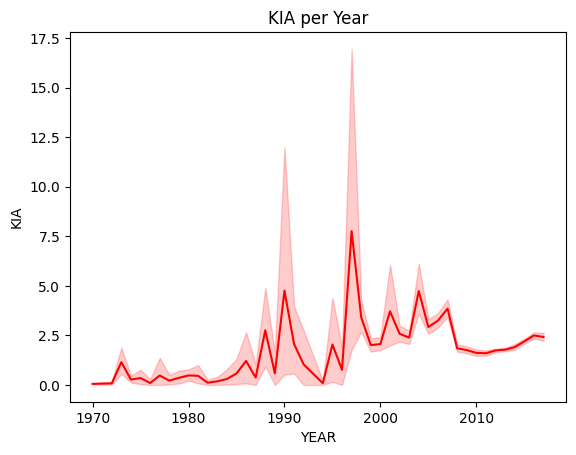

In [26]:
sns.lineplot(data=terrorism, x='Year', y='Killed', color='red')

plt.xlabel('YEAR')
plt.ylabel('KIA')
plt.title("KIA per Year")
plt.show()

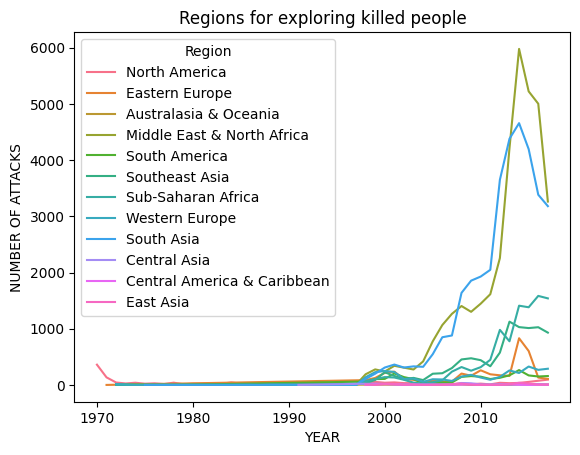

In [27]:
YEAR_ATTACKS_region=terrorism.groupby(['Year', 'Region']).size().reset_index(name='count')

sns.lineplot(x='Year', y='count', hue='Region', data=YEAR_ATTACKS_region, markers=True)
plt.title(f"Regions for exploring killed people")
plt.xlabel('YEAR')
plt.ylabel('NUMBER OF ATTACKS')
plt.show()

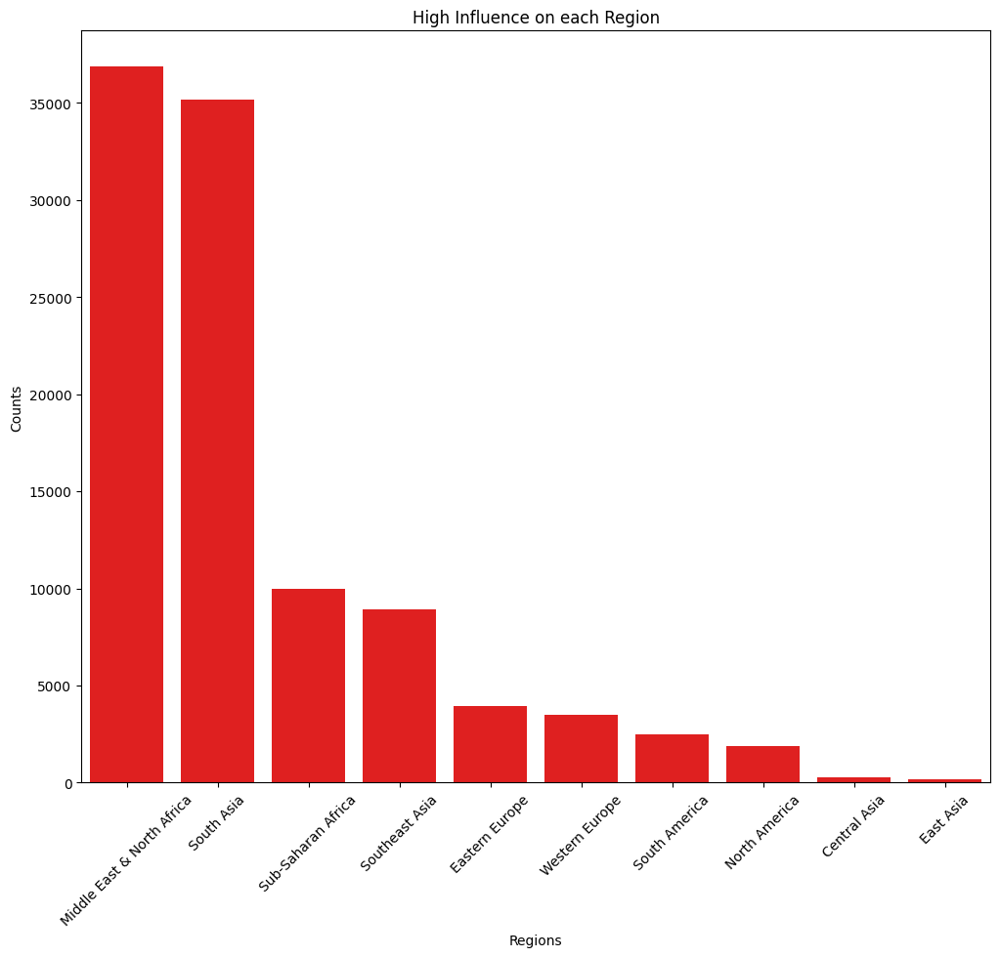

In [28]:
plt.subplots(figsize=(12,10))
Top=terrorism['Region'].value_counts()[:10].to_frame().reset_index()
Top.columns=['Region', 'Attacks_Counts']
sns.barplot(x='Region', y='Attacks_Counts', data=Top, color='red')
plt.title("High Influence on each Region")
plt.xlabel('Regions')
plt.ylabel('Counts')
plt.xticks(rotation=45)
plt.show()

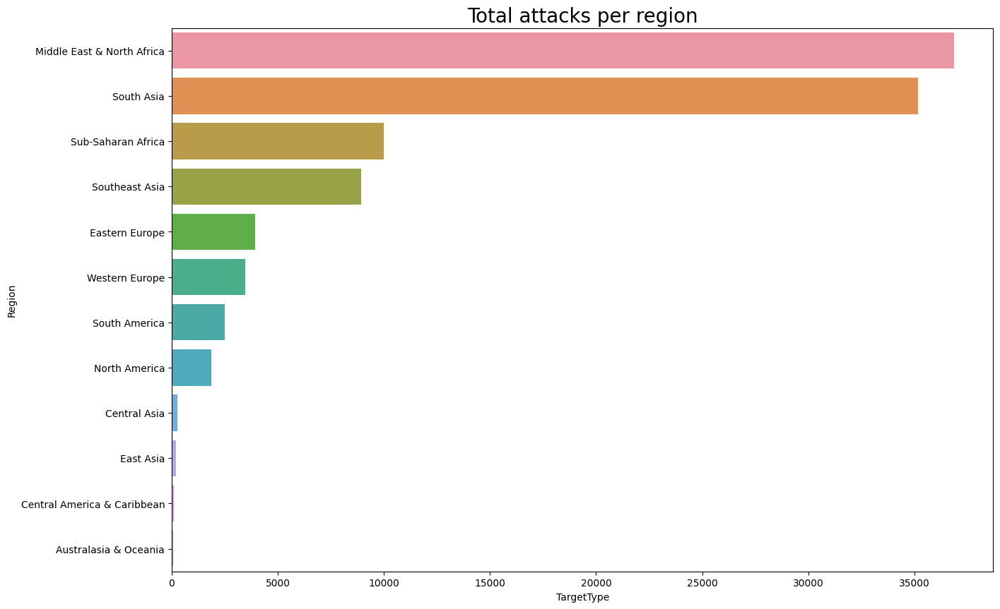

In [29]:
region_attacks=terrorism.Region.value_counts().to_frame().reset_index()
region_attacks.columns=['Region', 'TargetType']
plt.subplots(figsize=(15,10))
sns.barplot(data=region_attacks, x=region_attacks['TargetType'], y=region_attacks.Region, orient='h')
plt.title("Total attacks per region", fontsize=20)
plt.show()

In [30]:
region_attack_counts = terrorism.groupby(['Region', 'Target_type']).size().reset_index()
region_attack_counts.columns = ['Region', 'Target_type', 'Attack Count']

region = terrorism.Region.unique()

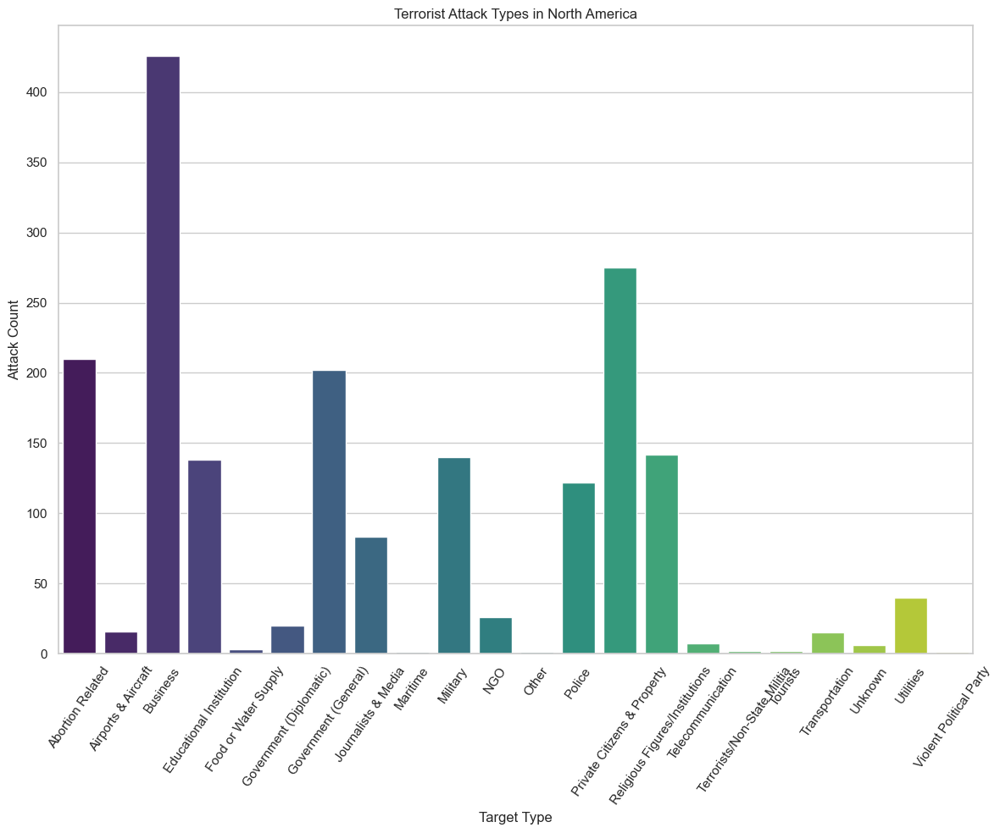

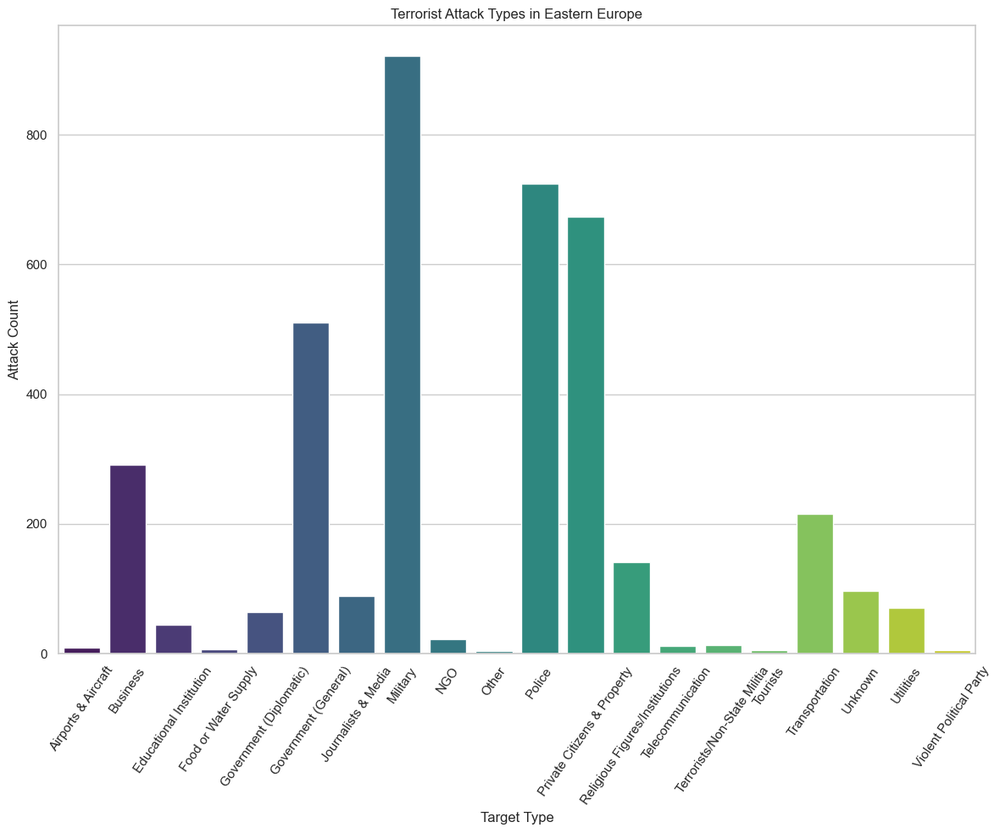

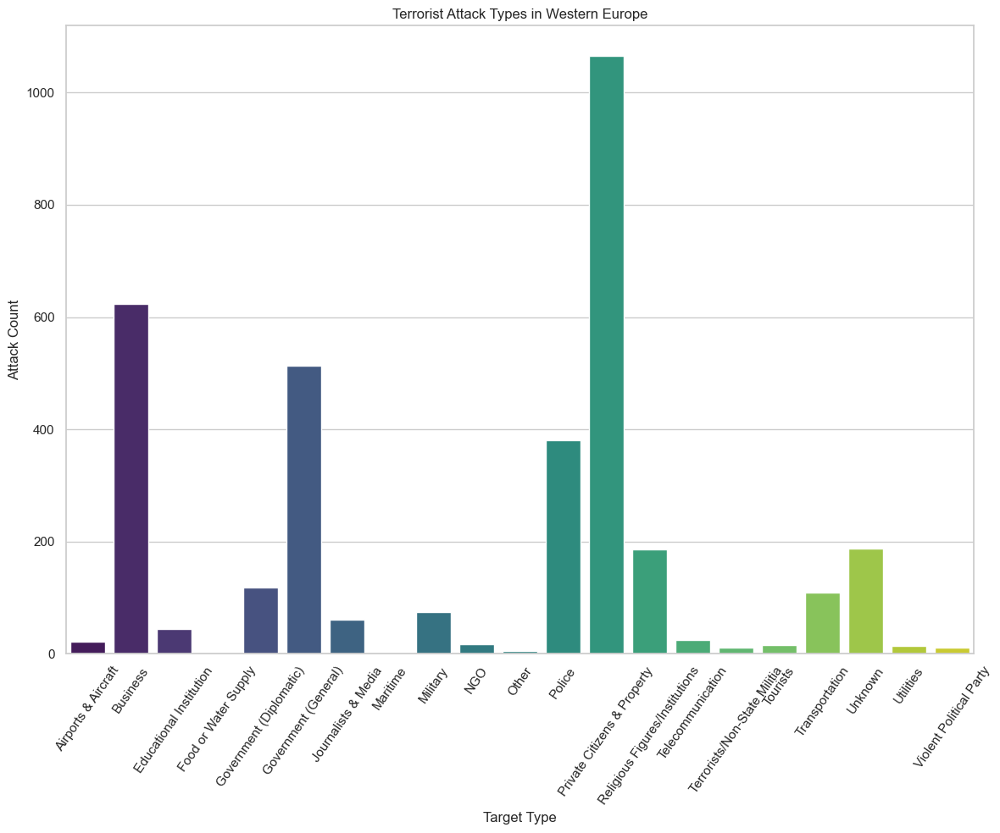

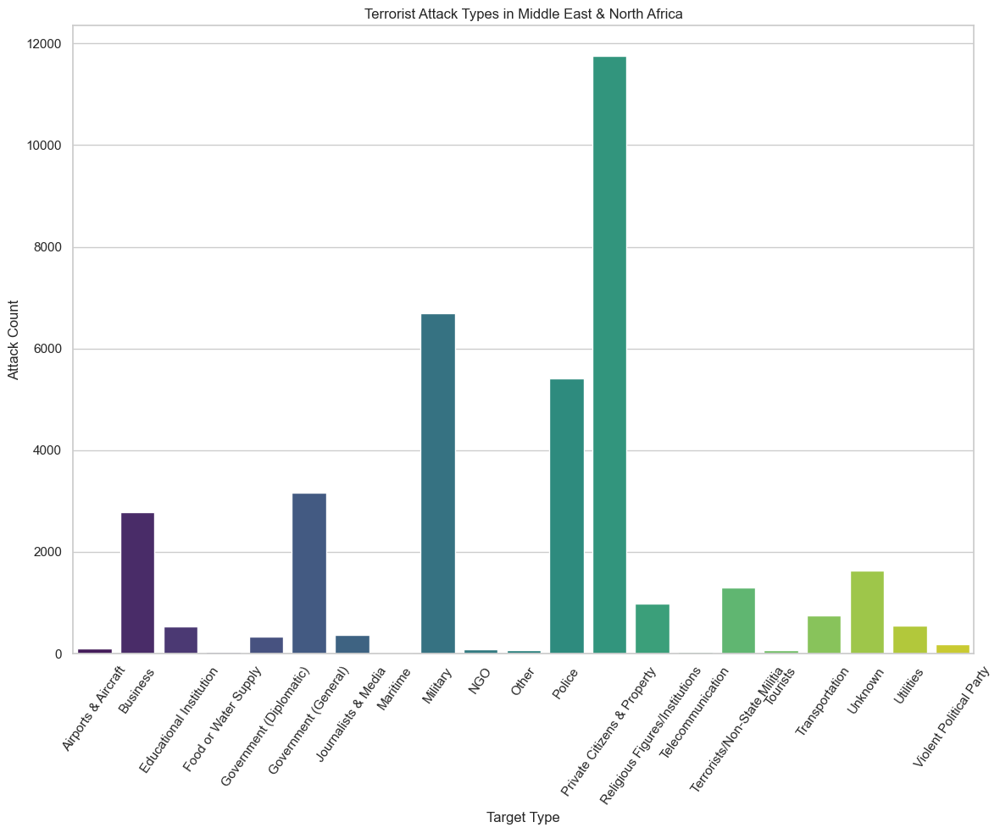

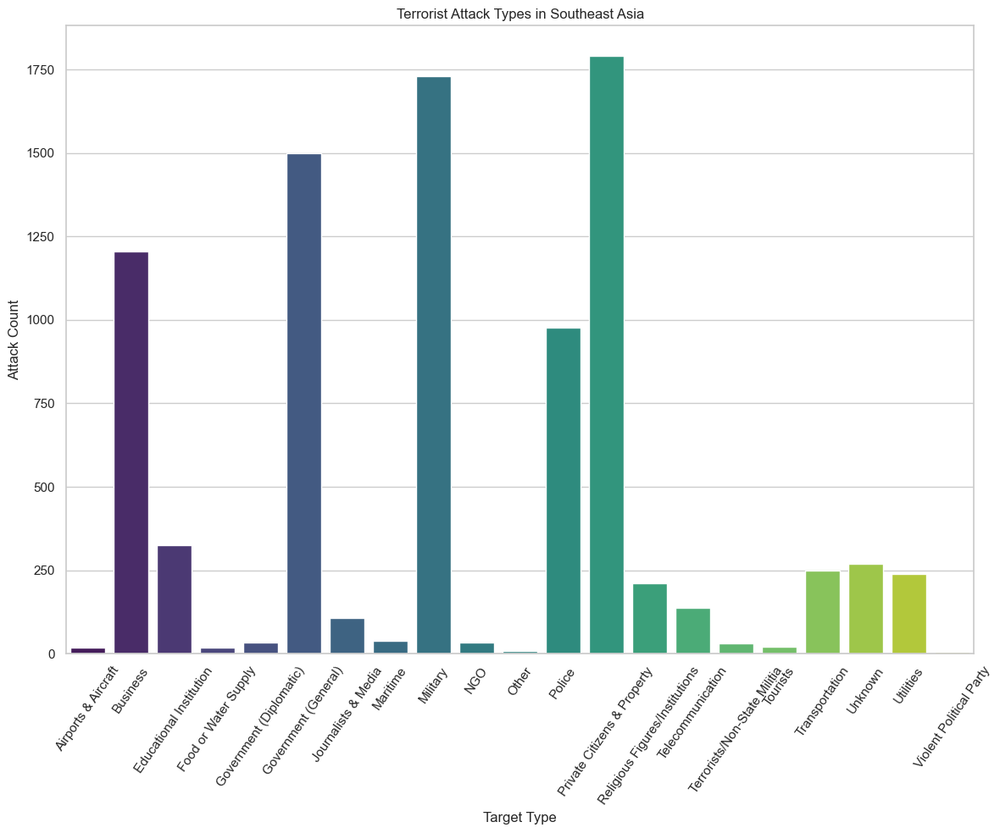

...

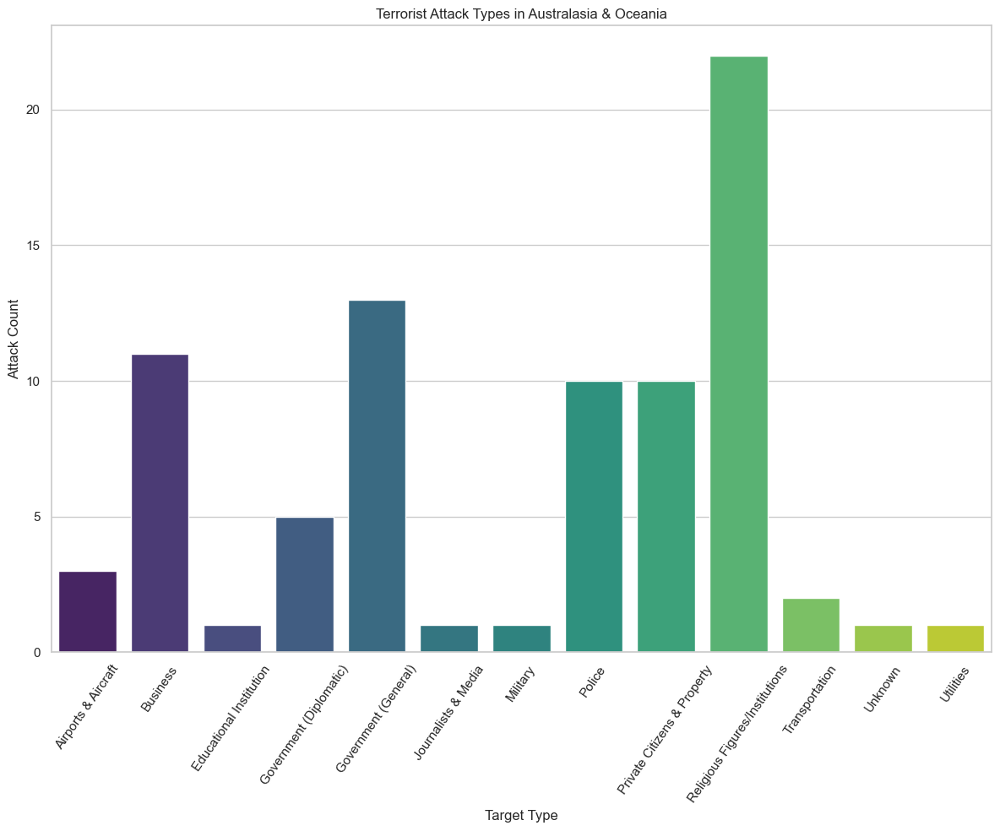

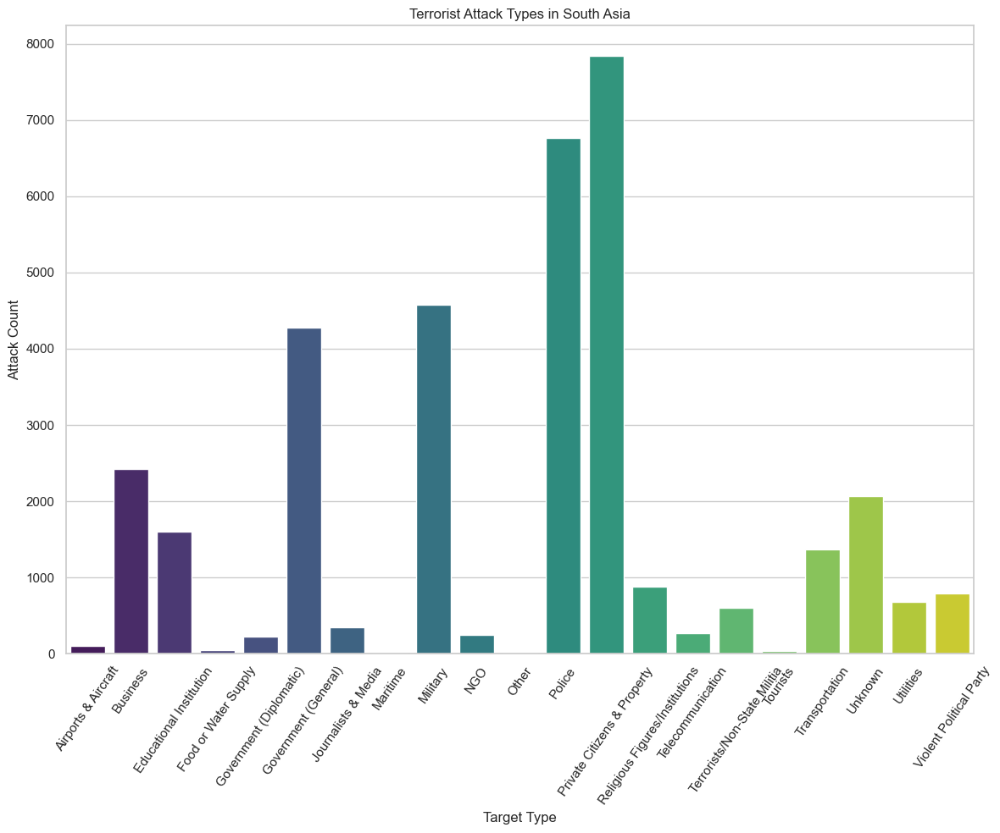

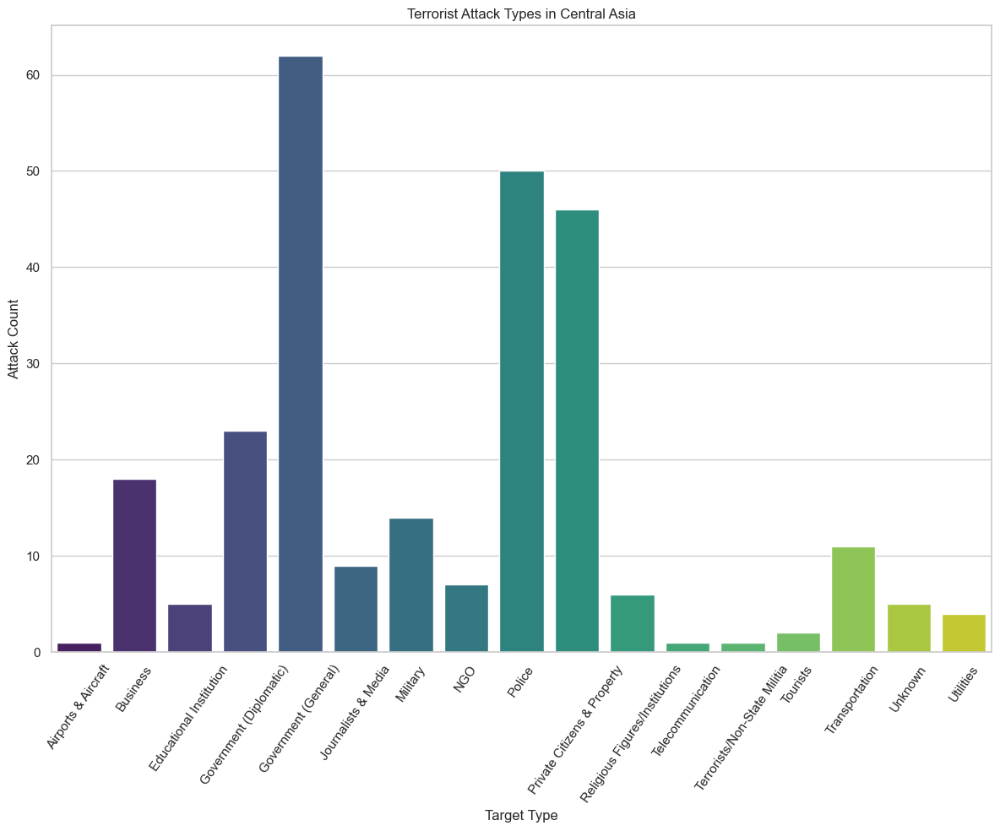

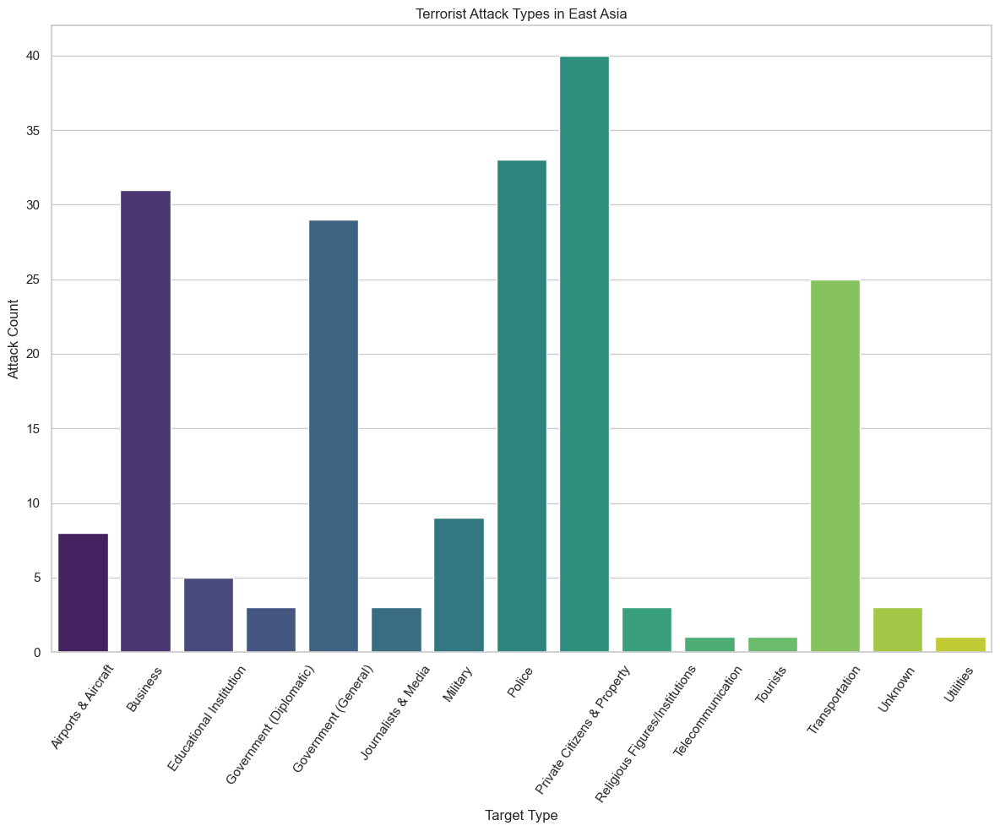

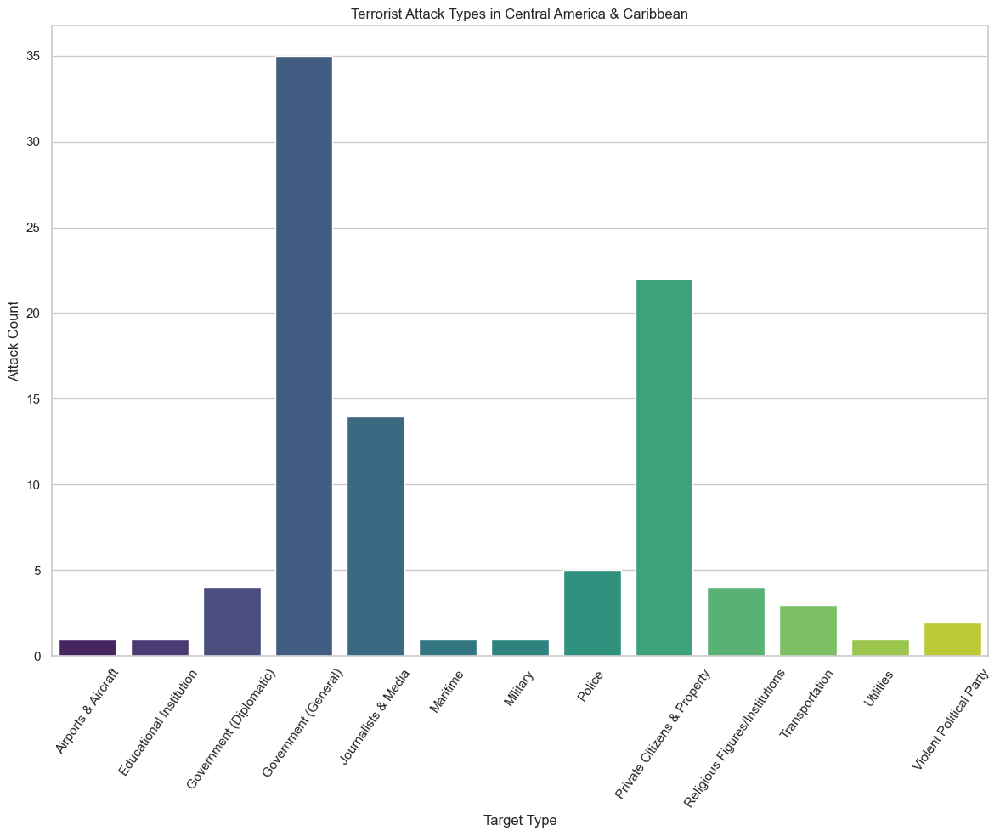

In [31]:
def region_attack_type(region):
    sns.set(style="whitegrid")
    
    for i in region:
        selected_region = i
        
        selected_region_data = region_attack_counts[region_attack_counts['Region'] == selected_region]

        plt.figure(figsize=(12, 10))
        sns.barplot(data=selected_region_data, x='Target_type', y='Attack Count', palette="viridis")
        plt.title(f'Terrorist Attack Types in {selected_region}')
        plt.xlabel('Target Type')
        plt.xticks(rotation=55)
        plt.tight_layout()

        plt.show()

region_attack_type(region)


In [32]:
groups=terrorism[['AttackType','Group','Target_type']]
groups

,AttackType,Group,Target_type
5,Armed Assault,Black Nationalists,Police
7,Bombing/Explosion,Unknown,Utilities
8,Facility/Infrastructure Attack,New Year's Gang,Military
9,Facility/Infrastructure Attack,New Year's Gang,Government (General)
11,Facility/Infrastructure Attack,Left-Wing Militants,Military
...,...,...,...
181686,Armed Assault,Al-Shabaab,Military
181687,Bombing/Explosion,Muslim extremists,Military
181688,Facility/Infrastructure Attack,Bangsamoro Islamic Freedom Movement (BIFM),Private Citizens & Property
181689,Bombing/Explosion,Unknown,Government (General)


In [33]:
group_counts = groups['Group'].value_counts()
sort = group_counts.sort_values(ascending=False)

sort = sort.iloc[1:]
top_10 = sort.head(10)

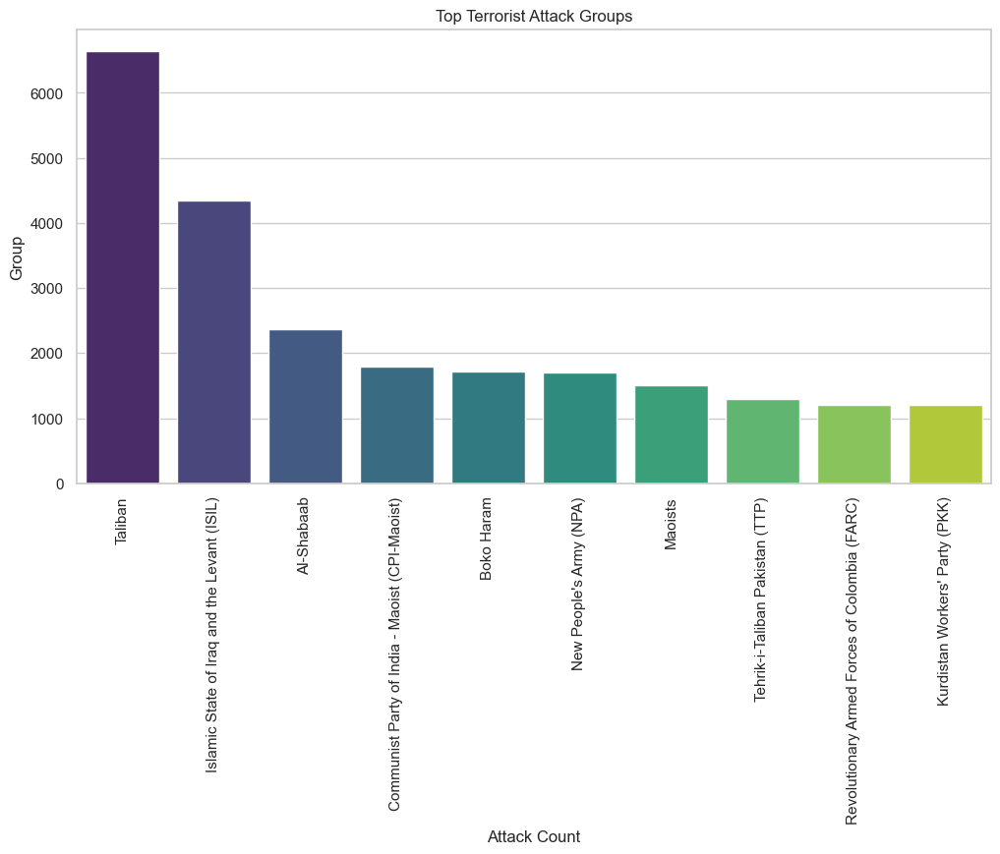

In [34]:
sns.set(style="whitegrid")

plt.figure(figsize=(12, 6))
sns.barplot(x=top_10.index, y=top_10.values, palette="viridis")
plt.title('Top Terrorist Attack Groups')
plt.xlabel('Attack Count')
plt.ylabel('Group')
plt.xticks(rotation = 90)
plt.show()

In [35]:
import plotly.express as px

country_counts = terrorism['Country'].value_counts().reset_index()
country_counts.columns = ['Country', 'Attack Count']
country_counts.head()

,Country,Attack Count
0,Iraq,21907
1,Pakistan,12120
2,Afghanistan,11435
3,India,8587
4,Philippines,4748


In [36]:
fig = px.choropleth(terrorism, locations=terrorism['Country'], locationmode="country names", color=terrorism['AttackType'], color_continuous_scale='Blues', animation_frame=terrorism['Year'], title="Reported terrorism", labels={'color':'AttackType'})
fig.show()

In [37]:
corr_data = terrorism.groupby('Country').agg({'Country': 'count', 'Killed': 'sum', 'Wounded': 'sum'})
corr_data.columns = ['Total Attacks', 'Total Killed', 'Total Wounded']
corr_data.reset_index(inplace=True)

corr_data['Casualties'] = corr_data['Total Killed'] + corr_data['Total Wounded']
corr_data.drop(['Total Killed', 'Total Wounded'],axis = 1,inplace = True)

corr_data

,Country,Total Attacks,Casualties
0,Afghanistan,11435,78039.0
1,Albania,20,19.0
2,Algeria,1428,8537.0
3,Angola,92,1923.0
4,Argentina,25,5.0
...,...,...,...
165,Yemen,2749,15933.0
166,Yugoslavia,94,237.0
167,Zaire,1,0.0
168,Zambia,12,3.0


In [38]:
Num_attacks=terrorism.groupby('Year').size().reset_index(name='Count')
Num_attacks

,Year,Count
0,1970,361
1,1971,136
2,1972,80
3,1973,27
4,1974,41
5,1975,26
6,1976,31
7,1977,19
8,1978,42
9,1979,14


In [39]:
Sum_attacks = Num_attacks['Count'].sum()
print('Total number of attacks all over the world:', Sum_attacks)

Total number of attacks all over the world: 103372


In [40]:
France = terrorism[(terrorism['Country'] == 'France')]
France.head(10)

,Year,Month,Day,Country,State,Region,City,Latitude,Longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type
1492,1972,9,19,France,Ile-de-France,Western Europe,Paris,48.856644,2.342330,Assassination,0.0,0.0,"United Nations Educational, Scientific and Cul...",09/19/1972: A letter bomb addressed to Miriam ...,Black September,Government (Diplomatic),Explosives
1493,1972,9,19,France,Ile-de-France,Western Europe,Paris,48.856644,2.342330,Assassination,0.0,0.0,Cultural Counsellor: Ellezer Yapao,09/19/1972: A letter bomb addressed to Ellezer...,Black September,Government (Diplomatic),Explosives
47586,1991,8,6,France,Ile-de-France,Western Europe,Paris,48.856644,2.342330,Armed Assault,2.0,0.0,"Shapour Bakhtiar, a former Iranian prime minis...","8/6/1991: Shapur Bakhtiyar, the former Iranian...",Iranian extremists,Government (General),Melee
67599,1998,2,6,France,Corsica,Western Europe,Ajaccio,41.930607,8.742907,Assassination,1.0,0.0,Claude Erignac,02/06/1998: A top French administrator in Ajac...,Corsican National Liberation Front (FLNC),Government (Diplomatic),Firearms
67954,1998,7,19,France,Corsica,Western Europe,Ajaccio,41.930607,8.742907,Bombing/Explosion,0.0,0.0,General Police Friendly Society Office,07/19/1998: The Corsican National Liberation F...,Corsican National Liberation Front- Historic C...,Police,Explosives
67956,1998,7,20,France,Corsica,Western Europe,Casabianda,42.093826,9.502568,Bombing/Explosion,0.0,0.0,Cazabainda Prison,07/20/1998: The Corsican National Liberation F...,Corsican National Liberation Front- Historic C...,Government (General),Explosives
68243,1998,10,11,France,Corsica,Western Europe,Bastia,42.699997,9.447317,Bombing/Explosion,0.0,0.0,"Government Tax Offices in Bastia, Corsica",10/11/1998: A bomb exploded in a building adjo...,Corsican National Liberation Front (FLNC),Government (General),Explosives
68244,1998,10,11,France,Corsica,Western Europe,Ajaccio,41.930607,8.742907,Bombing/Explosion,0.0,0.0,"The Electricite de France in Ajaccio, Corsica",10/11/1998: A garage belonging to the State Ut...,Corsican National Liberation Front (FLNC),Government (General),Explosives
68245,1998,10,11,France,Corsica,Western Europe,Ajaccio,41.930607,8.742907,Bombing/Explosion,0.0,0.0,"Government Treasury Office in Ajaccio, Corsica",10/11/1998: A Government Treasury Office in Aj...,Corsican National Liberation Front (FLNC),Government (General),Explosives
68289,1998,10,23,France,Provence-Alpes-Cote d'Azur,Western Europe,Marseille,43.296482,5.369780,Bombing/Explosion,0.0,0.0,"Front Nationale office in Marseille, France",10/23/1998: The Front Nationale (FN) office wa...,Partisan Sharpshooters,Private Citizens & Property,Explosives


In [41]:
attack_types_France = France.groupby(['AttackType','Killed']).size().reset_index(name='Count')
attack_types_France

,AttackType,Killed,Count
0,Armed Assault,0.0,32
1,Armed Assault,1.0,6
2,Armed Assault,2.0,2
3,Armed Assault,3.0,2
4,Armed Assault,4.0,1
5,Armed Assault,5.0,1
6,Armed Assault,15.0,1
7,Armed Assault,19.0,1
8,Armed Assault,87.0,1
9,Assassination,0.0,3


In [42]:
France_attacks = France['Killed'].count()
print('There were',France_attacks ,'attacks in France.')

There were 435 attacks in France.


In [43]:
France_wounded = France.groupby('Wounded').size().reset_index(name='Count')
France_wounded['Percentage'] = France_wounded['Count'] / France_attacks * 100
France_wounded

,Wounded,Count,Percentage
0,0.0,357,82.068966
1,1.0,33,7.586207
2,2.0,11,2.528736
3,3.0,11,2.528736
4,4.0,3,0.689655
5,6.0,1,0.229885
6,7.0,1,0.229885
7,8.0,2,0.459770
8,10.0,2,0.459770
9,11.0,1,0.229885


In [44]:
Wounded = terrorism.groupby(['Wounded']).size().reset_index(name='Count')
Wounded['Percentage'] =  Wounded['Count']/Sum_attacks *100
Wounded

,Wounded,Count,Percentage
0,0.0,55819,53.998181
1,1.0,11251,10.883992
2,2.0,7922,7.663584
3,3.0,5798,5.608869
4,4.0,3964,3.834694
...,...,...,...
212,1001.0,1,0.000967
213,1500.0,1,0.000967
214,4000.0,1,0.000967
215,8190.0,1,0.000967


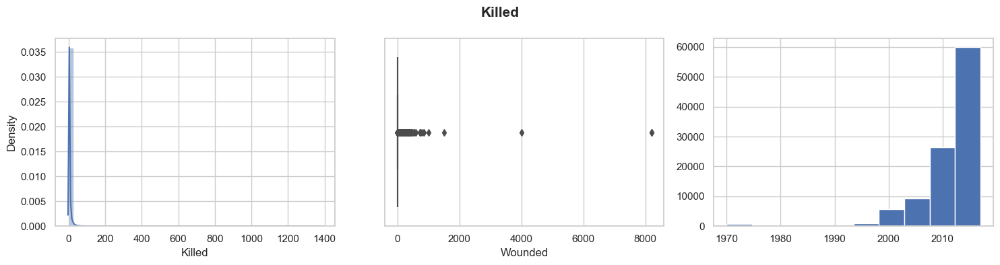

In [45]:
plt.figure(figsize=(15,4))
plt.suptitle("Killed", fontweight='bold', fontsize=15)

plt.subplot(1,3,1)
sns.distplot(terrorism['Killed'])

plt.subplot(1,3,2)
sns.boxplot(x=terrorism['Wounded'])

plt.subplot(1,3,3)
terrorism.Year.hist()

plt.tight_layout()

In [46]:
pd.options.mode.chained_assignment = None

In [47]:
pip install basemap-data-hires

In [48]:
pip install basemap-data

Note: you may need to restart the kernel to use updated packages.


In [49]:
terrorism = pd.read_csv('C:/Users/user/Desktop/Assignment for classes/terrorismData.csv',encoding='ISO-8859-1')

In [50]:
terrorism

,Year,Month,Day,Country,State,Region,City,Latitude,Longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type
0,1970,7,2,Dominican Republic,NaN,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown
1,1970,0,0,Mexico,Federal,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown
2,1970,1,0,Philippines,Tarlac,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown
3,1970,1,0,Greece,Attica,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives
4,1970,1,0,Japan,Fukouka,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181686,2017,12,31,Somalia,Middle Shebelle,Sub-Saharan Africa,Ceelka Geelow,2.359673,45.385034,Armed Assault,1.0,2.0,Checkpoint,12/31/2017: Assailants opened fire on a Somali...,Al-Shabaab,Military,Firearms
181687,2017,12,31,Syria,Lattakia,Middle East & North Africa,Jableh,35.407278,35.942679,Bombing/Explosion,2.0,7.0,Hmeymim Air Base,12/31/2017: Assailants launched mortars at the...,Muslim extremists,Military,Explosives
181688,2017,12,31,Philippines,Maguindanao,Southeast Asia,Kubentog,6.900742,124.437908,Facility/Infrastructure Attack,0.0,0.0,Houses,12/31/2017: Assailants set fire to houses in K...,Bangsamoro Islamic Freedom Movement (BIFM),Private Citizens & Property,Incendiary
181689,2017,12,31,India,Manipur,South Asia,Imphal,24.798346,93.940430,Bombing/Explosion,0.0,0.0,Office,12/31/2017: Assailants threw a grenade at a Fo...,Unknown,Government (General),Explosives


In [51]:
terrorism.columns.tolist()

['Year',
 'Month',
 'Day',
 'Country',
 'State',
 'Region',
 'City',
 'Latitude',
 'Longitude',
 'AttackType',
 'Killed',
 'Wounded',
 'Target',
 'Summary',
 'Group',
 'Target_type',
 'Weapon_type']

In [52]:
terrorism.Region.unique()

array(['Central America & Caribbean', 'North America', 'Southeast Asia',
       'Western Europe', 'East Asia', 'South America', 'Eastern Europe',
       'Sub-Saharan Africa', 'Middle East & North Africa',
       'Australasia & Oceania', 'South Asia', 'Central Asia'],
      dtype=object)

In [53]:
terrorism.Region.unique()

array(['Central America & Caribbean', 'North America', 'Southeast Asia',
       'Western Europe', 'East Asia', 'South America', 'Eastern Europe',
       'Sub-Saharan Africa', 'Middle East & North Africa',
       'Australasia & Oceania', 'South Asia', 'Central Asia'],
      dtype=object)

In [54]:
Europe_west = terrorism[terrorism['Region']=='Western Europe']

In [55]:
Europe_east = terrorism[terrorism['Region']=='Eastern Europe']

In [56]:
terrorism_E = pd.concat([Europe_west, Europe_east])

In [57]:
attack = terrorism_E["AttackType"].value_counts()
attack_terrorism = pd.DataFrame(attack)
attack_terrorism

,count
AttackType,
Bombing/Explosion,11274
Assassination,3338
Armed Assault,2998
Facility/Infrastructure Attack,2891
Hostage Taking (Kidnapping),489
Unknown,380
Unarmed Assault,210
Hostage Taking (Barricade Incident),110
Hijacking,93


In [58]:
TA_terrorism = pd.DataFrame(attack)
TA_terrorism

,count
AttackType,
Bombing/Explosion,11274
Assassination,3338
Armed Assault,2998
Facility/Infrastructure Attack,2891
Hostage Taking (Kidnapping),489
Unknown,380
Unarmed Assault,210
Hostage Taking (Barricade Incident),110
Hijacking,93


In [59]:
IRA = terrorism_E[terrorism_E["Group"] == "Irish Republican Army (IRA)"]

In [60]:
IRA = terrorism_E[terrorism_E["Group"] == "Irish Republican Army (IRA)"]
IRA_rel = IRA[["Year", "Country", "Region", "Latitude", "Longitude", "Killed"]]
IRA_rel.loc[IRA_rel["Killed"] == "NaN", "Killed"] = "np.nan"
IRA_rel.loc[IRA_rel["Killed"] == "nan", "Killed"] = "np.nan"
IRA_rel.loc[IRA_rel["Killed"] == "", "Killed"] = "np.nan"
IRA_rel.loc[IRA_rel["Year"] == "NaN", "Killed"] = "np.nan"
IRA_rel.loc[IRA_rel["Year"] == "nan", "Killed"] = "np.nan"
IRA_rel.loc[IRA_rel["Year"] == "", "Killed"] = "np.nan"
IRA_rel.loc[IRA_rel["Country"] == "NaN", "Killed"] = "np.nan"
IRA_rel.loc[IRA_rel["Country"] == "nan", "Killed"] = "np.nan"
IRA_rel.loc[IRA_rel["Country"] == "", "Killed"] = "np.nan"
IRA_rel.loc[IRA_rel["Region"] == "NaN", "Killed"] = "np.nan"
IRA_rel.loc[IRA_rel["Region"] == "nan", "Killed"] = "np.nan"
IRA_rel.loc[IRA_rel["Region"] == "", "Killed"] = "np.nan"
IRA_rel.loc[IRA_rel["Latitude"] == "NaN", "Killed"] = "np.nan"
IRA_rel.loc[IRA_rel["Latitude"] == "nan", "Killed"] = "np.nan"
IRA_rel.loc[IRA_rel["Latitude"] == "", "Killed"] = "np.nan"
IRA_rel.loc[IRA_rel["Longitude"] == "NaN", "Killed"] = "np.nan"
IRA_rel.loc[IRA_rel["Longitude"] == "nan", "Killed"] = "np.nan"
IRA_rel.loc[IRA_rel["Longitude"] == "", "Killed"] = "np.nan"
IRA_relevant = IRA_rel.dropna()

In [61]:
IRA_relevant

,Year,Country,Region,Latitude,Longitude,Killed
364,1970,United Kingdom,Western Europe,55.011562,-7.312045,5.0
365,1970,United Kingdom,Western Europe,55.011562,-7.312045,3.0
366,1970,United Kingdom,Western Europe,54.607712,-5.956210,1.0
367,1970,United Kingdom,Western Europe,54.607712,-5.956210,1.0
458,1970,United Kingdom,Western Europe,54.077313,-6.608787,2.0
...,...,...,...,...,...,...
77994,2005,United Kingdom,Western Europe,54.656828,-5.905191,0.0
80294,2006,Ireland,Western Europe,54.830603,-8.369233,1.0
80492,2006,United Kingdom,Western Europe,55.011562,-7.312045,0.0
87866,2008,United Kingdom,Western Europe,54.953823,-6.480002,0.0


In [62]:
import geopandas

In [63]:
gdf = geopandas.GeoDataFrame(IRA_relevant, geometry=geopandas.points_from_xy(IRA_relevant.Longitude, IRA_relevant.Latitude))

In [64]:
for index, location_info in IRA_relevant.iterrows():
  print(index, location_info["Country"])

364 United Kingdom
365 United Kingdom
366 United Kingdom
367 United Kingdom
458 United Kingdom
497 United Kingdom
605 United Kingdom
688 United Kingdom
702 United Kingdom
706 United Kingdom
719 United Kingdom
734 United Kingdom
760 United Kingdom
897 United Kingdom
935 United Kingdom
936 United Kingdom
949 United Kingdom
951 United Kingdom
952 United Kingdom
982 United Kingdom
983 United Kingdom
993 United Kingdom
994 United Kingdom
1001 United Kingdom
1002 United Kingdom
1007 United Kingdom
1011 United Kingdom
1012 United Kingdom
1016 United Kingdom
1018 United Kingdom
1019 United Kingdom
1030 United Kingdom
1031 United Kingdom
1032 United Kingdom
1034 United Kingdom
1035 United Kingdom
1036 United Kingdom
1048 United Kingdom
1049 United Kingdom
1050 United Kingdom
1051 United Kingdom
1054 United Kingdom
1055 United Kingdom
1056 United Kingdom
1057 United Kingdom
1060 United Kingdom
1063 United Kingdom
1069 United Kingdom
1070 United Kingdom
1073 United Kingdom
1083 United Kingdom
108

In [65]:
center = [49.558780483408924, 10.808020921435784]

IRA_map = folium.Map(location = center, zoom_start = 5)

for i, j in IRA_relevant.iterrows():
    location = [j['Latitude'], j['Longitude']]
    folium.Marker(location, popup = f'Country:{j["Country"]}').add_to(IRA_map)

IRA_map

In [66]:
IRA_map.save("IRA_map.html")

In [67]:
from folium import plugins
from folium.plugins import HeatMap

IRA_Heatmapa = folium.Map(location=[49.558780483408924, 10.808020921435784],
                    zoom_start = 4) 

IRA_relevant['Latitude'] = IRA_relevant['Latitude'].astype(float)
IRA_relevant['Longitude'] = IRA_relevant['Longitude'].astype(float)

IRA_relevant = IRA_relevant[['Latitude', 'Longitude']]

heat_data = [[row['Latitude'],row['Longitude']] for index, row in IRA_relevant.iterrows()]

HeatMap(heat_data).add_to(IRA_Heatmapa)

IRA_Heatmapa

In [68]:
IRA_Heatmapa.save("IRA_heatmap.html")

In [69]:
ETA = terrorism_E[terrorism_E["Group"] == "Basque Fatherland and Freedom (ETA)"]

In [70]:
ETA = terrorism_E[terrorism_E["Group"] == "Basque Fatherland and Freedom (ETA)"]
ETA_rel = ETA[["Year", "Country", "Region", "Latitude", "Longitude", "Killed"]]
ETA_rel.loc[ETA_rel["Killed"] == "NaN", "Killed"] = "np.nan"
ETA_rel.loc[ETA_rel["Killed"] == "nan", "Killed"] = "np.nan"
ETA_rel.loc[ETA_rel["Killed"] == "", "Killed"] = "np.nan"
ETA_rel.loc[ETA_rel["Year"] == "NaN", "Killed"] = "np.nan"
ETA_rel.loc[ETA_rel["Year"] == "nan", "Killed"] = "np.nan"
ETA_rel.loc[ETA_rel["Year"] == "", "Killed"] = "np.nan"
ETA_rel.loc[ETA_rel["Country"] == "NaN", "Killed"] = "np.nan"
ETA_rel.loc[ETA_rel["Country"] == "nan", "Killed"] = "np.nan"
ETA_rel.loc[ETA_rel["Country"] == "", "Killed"] = "np.nan"
ETA_rel.loc[ETA_rel["Region"] == "NaN", "Killed"] = "np.nan"
ETA_rel.loc[ETA_rel["Region"] == "nan", "Killed"] = "np.nan"
ETA_rel.loc[ETA_rel["Region"] == "", "Killed"] = "np.nan"
ETA_rel.loc[ETA_rel["Latitude"] == "NaN", "Killed"] = "np.nan"
ETA_rel.loc[ETA_rel["Latitude"] == "nan", "Killed"] = "np.nan"
ETA_rel.loc[ETA_rel["Latitude"] == "", "Killed"] = "np.nan"
ETA_rel.loc[ETA_rel["Longitude"] == "NaN", "Killed"] = "np.nan"
ETA_rel.loc[ETA_rel["Longitude"] == "nan", "Killed"] = "np.nan"
ETA_rel.loc[ETA_rel["Longitude"] == "", "Killed"] = "np.nan"
ETA_relevant = ETA_rel.dropna()

In [71]:
ETA_relevant

,Year,Country,Region,Latitude,Longitude,Killed
625,1970,Spain,Western Europe,43.291618,-1.977903,0.0
899,1971,Spain,Western Europe,43.291618,-1.977903,0.0
1125,1972,Spain,Western Europe,43.150000,-2.610278,0.0
1462,1972,Spain,Western Europe,43.230556,-2.845833,1.0
1708,1973,Spain,Western Europe,42.815372,-1.653616,0.0
...,...,...,...,...,...,...
93408,2009,Spain,Western Europe,43.152560,-3.028622,0.0
93993,2009,Spain,Western Europe,43.258434,-2.921819,0.0
94001,2009,Spain,Western Europe,43.169068,-2.632655,0.0
98218,2010,Spain,Western Europe,42.849640,-2.692359,0.0


In [72]:
gdf = geopandas.GeoDataFrame(ETA_relevant, geometry=geopandas.points_from_xy(ETA_relevant.Longitude, ETA_relevant.Latitude))

In [73]:
for index, location_info in ETA_relevant.iterrows():
  print(index, location_info["Country"])

625 Spain
899 Spain
1125 Spain
1462 Spain
1708 Spain
2141 Spain
2317 Spain
2345 Spain
2407 Spain
2413 Spain
2524 Spain
2534 Spain
2538 Spain
2558 Spain
2618 Spain
2691 Spain
2900 Spain
2910 Spain
3002 Spain
3004 Spain
3011 Spain
3020 Spain
3022 Spain
3071 Spain
3088 Spain
3112 Spain
3145 Spain
3163 Spain
3164 Spain
3236 Spain
3255 France
3303 Spain
3331 Spain
3348 Spain
3416 Spain
3442 Spain
3523 Spain
3527 Spain
3579 Spain
3583 Spain
3630 Spain
3631 Spain
3658 Spain
3663 Spain
3694 France
3695 France
3907 Spain
4179 France
4193 Spain
4395 Spain
4412 Spain
4428 Spain
4436 Spain
4437 Spain
4489 Spain
4733 Spain
4737 Spain
4776 Spain
4796 Spain
4800 Spain
4837 Spain
4838 Spain
4840 Spain
4841 Spain
4842 Spain
4843 Spain
4844 Spain
4847 Spain
4848 Spain
4849 Spain
4850 Spain
4856 Spain
4857 Spain
4859 Spain
4890 Spain
4892 Spain
4894 Spain
4895 Spain
4896 Spain
4935 Spain
5201 Spain
5340 Spain
5368 Spain
5399 Spain
5402 Spain
5403 Spain
5404 Spain
5405 Spain
5406 Spain
5411 Spain
5413 Spa

In [74]:
center = [49.558780483408924, 10.808020921435784]

ETA_map = folium.Map(location = center, zoom_start = 5)


for m, E in ETA_relevant.iterrows():
    location = [E['Latitude'], E['Longitude']]
    folium.Marker(location, popup = f'Country:{E["Country"]}').add_to(ETA_map)
    
ETA_map

In [75]:
ETA_map.save("ETA_map.html")

In [76]:
from folium import plugins
from folium.plugins import HeatMap

ETA_Heatmapa = folium.Map(location=[49.558780483408924, 10.808020921435784],
                    zoom_start = 5) 

ETA_relevant['Latitude'] = ETA_relevant['Latitude'].astype(float)
ETA_relevant['Longitude'] = ETA_relevant['Longitude'].astype(float)
ETA_relevant = ETA_relevant[['Latitude', 'Longitude']]

heat_data_2 = [[row['Latitude'],row['Longitude']] for index, row in ETA_relevant.iterrows()]

HeatMap(heat_data_2).add_to(ETA_Heatmapa)

ETA_Heatmapa

In [77]:
ETA_Heatmapa.save("ETA_heatmap.html")

In [78]:
FLNC = terrorism_E[terrorism_E["Group"] == "Corsican National Liberation Front (FLNC)"]

In [79]:
FLNC = terrorism_E[terrorism_E["Group"] == "Corsican National Liberation Front (FLNC)"]
FLNC_rel = FLNC[["Year", "Country", "Region", "Latitude", "Longitude", "Killed"]]
FLNC_rel.loc[FLNC_rel["Killed"] == "NaN", "Killed"] = "np.nan"
FLNC_rel.loc[FLNC_rel["Killed"] == "nan", "Killed"] = "np.nan"
FLNC_rel.loc[FLNC_rel["Killed"] == "", "Killed"] = "np.nan"
FLNC_rel.loc[FLNC_rel["Year"] == "NaN", "Killed"] = "np.nan"
FLNC_rel.loc[FLNC_rel["Year"] == "nan", "Killed"] = "np.nan"
FLNC_rel.loc[FLNC_rel["Year"] == "", "Killed"] = "np.nan"
FLNC_rel.loc[FLNC_rel["Country"] == "NaN", "Killed"] = "np.nan"
FLNC_rel.loc[FLNC_rel["Country"] == "nan", "Killed"] = "np.nan"
FLNC_rel.loc[FLNC_rel["Country"] == "", "Killed"] = "np.nan"
FLNC_rel.loc[FLNC_rel["Region"] == "NaN", "Killed"] = "np.nan"
FLNC_rel.loc[FLNC_rel["Region"] == "nan", "Killed"] = "np.nan"
FLNC_rel.loc[FLNC_rel["Region"] == "", "Killed"] = "np.nan"
FLNC_rel.loc[FLNC_rel["Latitude"] == "NaN", "Killed"] = "np.nan"
FLNC_rel.loc[FLNC_rel["Latitude"] == "nan", "Killed"] = "np.nan"
FLNC_rel.loc[FLNC_rel["Latitude"] == "", "Killed"] = "np.nan"
FLNC_rel.loc[FLNC_rel["Longitude"] == "NaN", "Killed"] = "np.nan"
FLNC_rel.loc[FLNC_rel["Longitude"] == "nan", "Killed"] = "np.nan"
FLNC_rel.loc[FLNC_rel["Longitude"] == "", "Killed"] = "np.nan"
FLNC_relevant = FLNC_rel.dropna()

In [80]:
gdf = geopandas.GeoDataFrame(FLNC, geometry=geopandas.points_from_xy(FLNC.Longitude, FLNC.Latitude))
for index, location_info in FLNC.iterrows():
  print(index, location_info["Country"])

2296 France
3996 France
4121 France
5160 France
5703 France
5820 France
5968 France
5969 France
6507 France
6508 France
6509 France
6510 France
6557 France
6558 France
6603 France
6653 France
6774 France
7259 France
7300 France
7784 France
7785 France
7786 France
7787 France
7788 France
7789 France
7790 France
7791 France
7792 France
7793 France
7794 France
7795 France
7796 France
7797 France
7798 France
7799 France
7800 France
7801 France
7802 France
7803 France
7804 France
7805 France
7806 France
7807 France
7808 France
7809 France
7810 France
7811 France
7812 France
7813 France
7814 France
7815 France
7816 France
7817 France
7866 France
8054 France
8055 France
8056 France
8057 France
8058 France
8059 France
8060 France
8061 France
8159 France
8310 France
8311 France
8312 France
8313 France
8314 France
8315 France
8316 France
8317 France
8318 France
8319 France
8320 France
8321 France
8322 France
8323 France
8324 France
8325 France
8326 France
8327 France
8328 France
8329 France
8330

In [81]:
center = [49.558780483408924, 10.808020921435784]

FLNC_map = folium.Map(location = center, zoom_start = 5)


for c, f in FLNC_relevant.iterrows():
    location = [f['Latitude'], f['Longitude']]
    folium.Marker(location, popup = f'Country:{f["Country"]}').add_to(FLNC_map)
    
FLNC_map

In [82]:
FLNC_map.save("FLNC_map.html")

In [83]:
from folium import plugins
from folium.plugins import HeatMap

FLNC_Heatmapa = folium.Map(location=[49.558780483408924, 10.808020921435784],
                    zoom_start = 5) 

FLNC_relevant['Latitude'] = FLNC_relevant['Latitude'].astype(float)
FLNC_relevant['Longitude'] = FLNC_relevant['Longitude'].astype(float)
FLNC_relevant = FLNC_relevant[['Latitude', 'Longitude']]

heat_data_3 = [[row['Latitude'],row['Longitude']] for index, row in FLNC_relevant.iterrows()]

HeatMap(heat_data_3).add_to(FLNC_Heatmapa)

FLNC_Heatmapa

In [84]:
FLNC_Heatmapa.save("FLNC_heatmap.html")

In [85]:
DPR = terrorism_E[terrorism_E["Group"] == "Donetsk People's Republic"]

In [86]:
DPR = terrorism_E[terrorism_E["Group"] == "Donetsk People's Republic"]
DPR_rel = DPR[["Year", "Country", "Region", "Latitude", "Longitude", "Killed"]]
DPR_rel.loc[DPR_rel["Killed"] == "NaN", "Killed"] = "np.nan"
DPR_rel.loc[DPR_rel["Killed"] == "nan", "Killed"] = "np.nan"
DPR_rel.loc[DPR_rel["Killed"] == "", "Killed"] = "np.nan"
DPR_rel.loc[DPR_rel["Year"] == "NaN", "Killed"] = "np.nan"
DPR_rel.loc[DPR_rel["Year"] == "nan", "Killed"] = "np.nan"
DPR_rel.loc[DPR_rel["Year"] == "", "Killed"] = "np.nan"
DPR_rel.loc[DPR_rel["Country"] == "NaN", "Killed"] = "np.nan"
DPR_rel.loc[DPR_rel["Country"] == "nan", "Killed"] = "np.nan"
DPR_rel.loc[DPR_rel["Country"] == "", "Killed"] = "np.nan"
DPR_rel.loc[DPR_rel["Region"] == "NaN", "Killed"] = "np.nan"
DPR_rel.loc[DPR_rel["Region"] == "nan", "Killed"] = "np.nan"
DPR_rel.loc[DPR_rel["Region"] == "", "Killed"] = "np.nan"
DPR_rel.loc[DPR_rel["Latitude"] == "NaN", "Killed"] = "np.nan"
DPR_rel.loc[DPR_rel["Latitude"] == "nan", "Killed"] = "np.nan"
DPR_rel.loc[DPR_rel["Latitude"] == "", "Killed"] = "np.nan"
DPR_rel.loc[DPR_rel["Longitude"] == "NaN", "Killed"] = "np.nan"
DPR_rel.loc[DPR_rel["Longitude"] == "nan", "Killed"] = "np.nan"
DPR_rel.loc[DPR_rel["Longitude"] == "", "Killed"] = "np.nan"
DPR_relevant = DPR_rel.dropna()

In [87]:
gdf_4 = geopandas.GeoDataFrame(DPR_relevant, geometry=geopandas.points_from_xy(DPR_relevant.Longitude, DPR_relevant.Latitude))
for index, location_info in DPR.iterrows():
  print(index, location_info["Country"])

130212 Ukraine
130217 Ukraine
130226 Ukraine
130228 Ukraine
130229 Ukraine
130231 Ukraine
130232 Ukraine
130293 Ukraine
130296 Ukraine
130300 Ukraine
130301 Ukraine
130303 Ukraine
130343 Ukraine
130357 Ukraine
130358 Ukraine
130359 Ukraine
130432 Ukraine
130437 Ukraine
130471 Ukraine
130472 Ukraine
130535 Ukraine
130536 Ukraine
130565 Ukraine
130576 Ukraine
130606 Ukraine
130636 Ukraine
130683 Ukraine
130691 Ukraine
130692 Ukraine
130735 Ukraine
130736 Ukraine
130746 Ukraine
130747 Ukraine
130788 Ukraine
130846 Ukraine
130847 Ukraine
130862 Ukraine
130898 Ukraine
130899 Ukraine
130900 Ukraine
130938 Ukraine
130965 Ukraine
130967 Ukraine
130984 Ukraine
130986 Ukraine
130988 Ukraine
131046 Ukraine
131048 Ukraine
131082 Ukraine
131089 Ukraine
131175 Ukraine
131185 Ukraine
131193 Ukraine
131201 Ukraine
131203 Ukraine
131257 Ukraine
131258 Ukraine
131307 Ukraine
131355 Ukraine
131357 Ukraine
131407 Ukraine
131412 Ukraine
131461 Ukraine
131463 Ukraine
131513 Ukraine
131515 Ukraine
131534 Ukr

In [88]:
center = [49.558780483408924, 10.808020921435784]

DPR_map = folium.Map(location = center, zoom_start = 5)


for d, r in DPR_relevant.iterrows():
    location = [r['Latitude'], r['Longitude']]
    folium.Marker(location, popup = f'Country:{r["Country"]}').add_to(DPR_map)

DPR_map

In [89]:
DPR_map.save("DPR_map.html")

In [90]:
from folium import plugins
from folium.plugins import HeatMap

DPR_Heatmap = folium.Map(location=[49.558780483408924, 10.808020921435784],
                    zoom_start = 5) 

DPR_relevant['Latitude'] = DPR_relevant['Latitude'].astype(float)
DPR_relevant['Longitude'] = DPR_relevant['Longitude'].astype(float)
DPR_relevant = DPR_relevant[['Latitude', 'Longitude']]

heat_data_4 = [[row['Latitude'],row['Longitude']] for index, row in DPR_relevant.iterrows()]

HeatMap(heat_data_4).add_to(DPR_Heatmap)

DPR_Heatmap

In [91]:
DPR_Heatmap.save("DPR_heatmap.html")

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.metrics import mean_absolute_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import OneHotEncoder

In [6]:
terrorism.head()

,Year,Month,Day,Country,State,Region,City,Latitude,Longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type
0,1970,7,2,Dominican Republic,NaN,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown
1,1970,0,0,Mexico,Federal,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown
2,1970,1,0,Philippines,Tarlac,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown
3,1970,1,0,Greece,Attica,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives
4,1970,1,0,Japan,Fukouka,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary


In [7]:
terrorism.isnull().sum()

Year               0
Month              0
Day                0
Country            0
State            421
Region             0
City             435
Latitude        4556
Longitude       4557
AttackType         0
Killed         10313
Wounded        16311
Target           638
Summary        66129
Group              0
Target_type        0
Weapon_type        0
dtype: int64

In [8]:
cc1 = [col for col in terrorism.columns if terrorism[col].isnull().sum()>60]
terrorism = terrorism.drop(columns=cc1)
terrorism.isnull().sum()

Year           0
Month          0
Day            0
Country        0
Region         0
AttackType     0
Group          0
Target_type    0
Weapon_type    0
dtype: int64

In [9]:
y = terrorism['Year'].fillna(terrorism['Year'].mean())
y.isnull().sum()

0

In [10]:
a = terrorism.drop('Year', axis=1)
X = a.select_dtypes(exclude=['object'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
X_train.head()

,Month,Day
97867,8,25
112918,12,10
97229,7,8
129167,3,22
149986,6,30


In [11]:
terrorism.dropna(axis=0)
X = terrorism.drop('Year', axis = 1)
y = terrorism['Year']

cols_with_missing = [col for col in X.columns if X[col].isnull().any()] 
X.drop(cols_with_missing, axis=1, inplace=True)
X_test.drop(cols_with_missing, axis=1, inplace=True)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

X_train.head()

,Month,Day,Country,Region,AttackType,Group,Target_type,Weapon_type
97867,8,25,Iraq,Middle East & North Africa,Assassination,Unknown,Government (General),Explosives
112918,12,10,Nigeria,Sub-Saharan Africa,Bombing/Explosion,Boko Haram,Business,Explosives
97229,7,8,India,South Asia,Armed Assault,Communist Party of India - Maoist (CPI-Maoist),Police,Firearms
129167,3,22,Iraq,Middle East & North Africa,Bombing/Explosion,Islamic State of Iraq and the Levant (ISIL),Utilities,Explosives
149986,6,30,Egypt,Middle East & North Africa,Bombing/Explosion,Unknown,Telecommunication,Explosives


In [12]:
oc = [col for col in X_train.columns if X_train[col].dtype == "object"]
object_cols = (X_train.dtypes == 'object')
print('Categorical columns:', oc)

Categorical columns: ['Country', 'Region', 'AttackType', 'Group', 'Target_type', 'Weapon_type']


In [13]:
from sklearn.preprocessing import OneHotEncoder

# Apply one-hot encoder to each column with categorical data
OH_encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
OH_cols_train = pd.DataFrame(OH_encoder.fit_transform(X_train[oc]))
OH_cols_test = pd.DataFrame(OH_encoder.transform(X_test[oc]))

# One-hot encoding replaced index
OH_cols_train.index = X_train.index
OH_cols_test.index = X_test.index

# Remove categorical columns to replace with one-hot encoding
num_X_train = X_train.drop(oc, axis=1)
num_X_test = X_test.drop(oc, axis=1)

# Add one-hot encoded columns to numerical features
OH_X_train = pd.concat([num_X_train, OH_cols_train], axis=1)
OH_X_test = pd.concat([num_X_test, OH_cols_test], axis=1)

# Ensure all columns have string type
OH_X_train.columns = OH_X_train.columns.astype(str)
OH_X_test.columns = OH_X_test.columns.astype(str)

print("MAE (One-Hot Encoding):") 
print((OH_X_train, OH_X_test, y_train, y_test))

MAE (One-Hot Encoding):
(        Month  Day    0    1    2    3    4    5    6    7  ...  3424  3425  \
97867       8   25  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...   1.0   0.0   
112918     12   10  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...   1.0   0.0   
97229       7    8  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...   0.0   0.0   
129167      3   22  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...   1.0   0.0   
149986      6   30  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...   1.0   0.0   
...       ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   ...   ...   
152315      8   25  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...   0.0   0.0   
176963      7   14  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...   0.0   0.0   
117952      6   10  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...   1.0   0.0   
173685      4    7  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...   1.0   0.0   
43567       8    2  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...   0.0   0.0   

        3426  3427  3428  

In [15]:
dtr = DecisionTreeRegressor(random_state=1)
dtr.fit(OH_X_train, y_train)

DecisionTreeRegressor(random_state=1)

In [16]:
pred = dtr.predict(OH_X_test)
print('DTR MAE:', metrics.mean_absolute_error(y_test, pred))
print('DTR MSE:', metrics.mean_squared_error(y_test, pred))
print('DTR RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred)))
print('DTR R2 Score:', dtr.score(OH_X_test,y_test))

DTR MAE: 4.080712032661781
DTR MSE: 56.272191901327986
DTR RMSE: 7.501479314197166
DTR R2 Score: 0.67981089004547


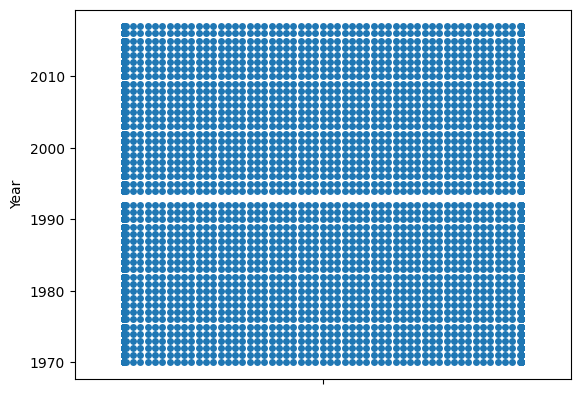

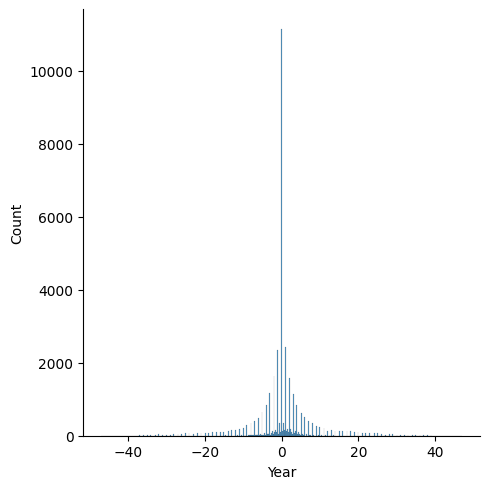

In [25]:
sns.swarmplot(y_test)
sns.displot(y_test-pred)

In [18]:
gbr = GradientBoostingRegressor(random_state=0)
gbr.fit(OH_X_train, y_train)

gbrp = gbr.predict(OH_X_test)
print('GBR MAE:', metrics.mean_absolute_error(y_test, gbrp))
print('GBR MSE:', metrics.mean_squared_error(y_test, gbrp))
print('GBR RMSE:', np.sqrt(metrics.mean_squared_error(y_test, gbrp)))
print('GBR R2 Score:', gbr.score(OH_X_test,y_test))
plt.show()

KeyboardInterrupt: 

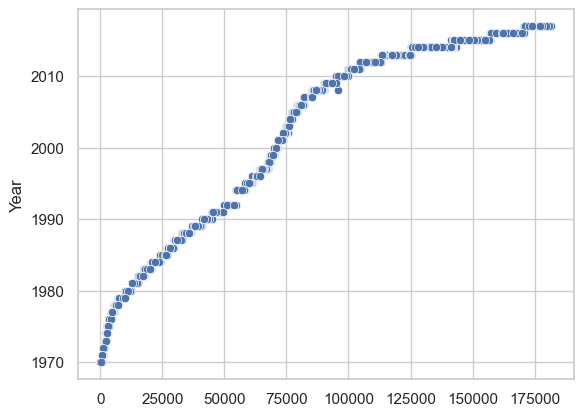

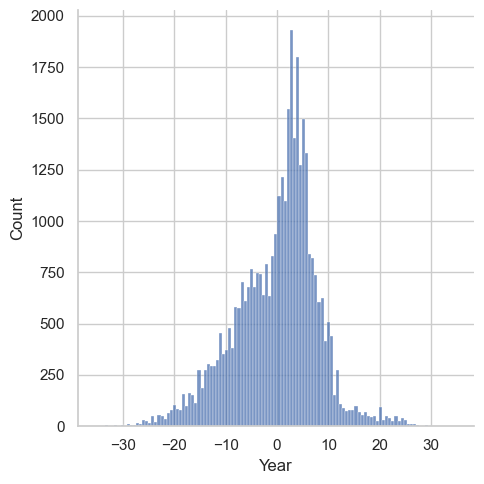

In [105]:
sns.scatterplot(y_test)
sns.displot(y_test-gbrp)

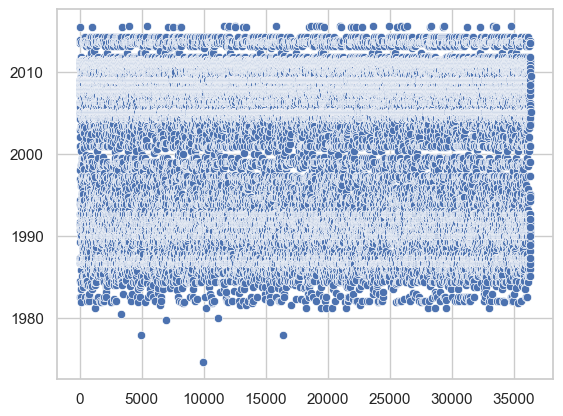

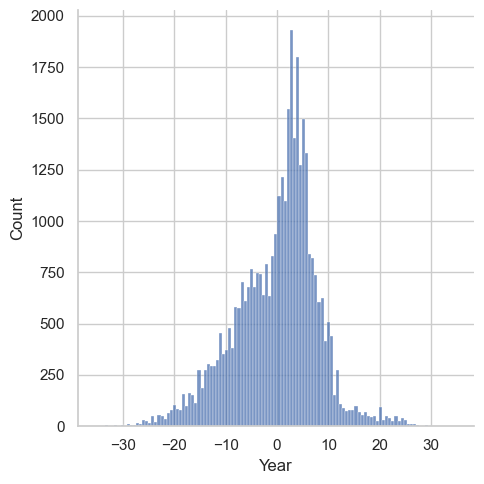

In [106]:
sns.scatterplot(gbrp)
sns.displot(y_test-gbrp)

In [109]:
rfr=RandomForestRegressor(random_state=1)
rfr.fit(OH_X_train, y_train)
pred=rfr.predict(OH_X_test)
print('RFR MAE:', metrics.mean_absolute_error(y_test, pred))
print('RFR MSE:', metrics.mean_squared_error(y_test, pred))
print('RFR RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred)))
print('RFR R2 Score:', rfr.score(OH_X_test,y_test))


RFR MAE: 3.603015800630001
RFR MSE: 35.63147504404225
RFR RMSE: 5.969210588012643
RFR R2 Score: 0.7972566929554828


Axes(0.125,0.11;0.775x0.77)


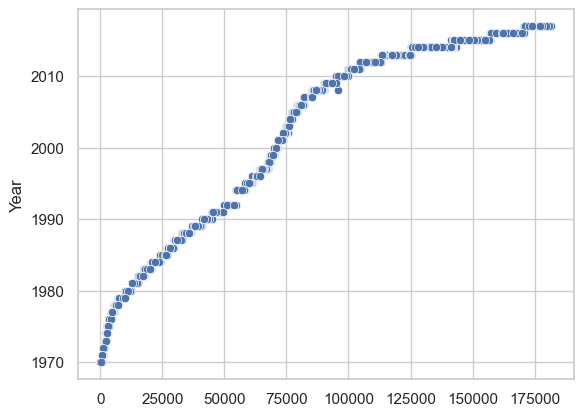

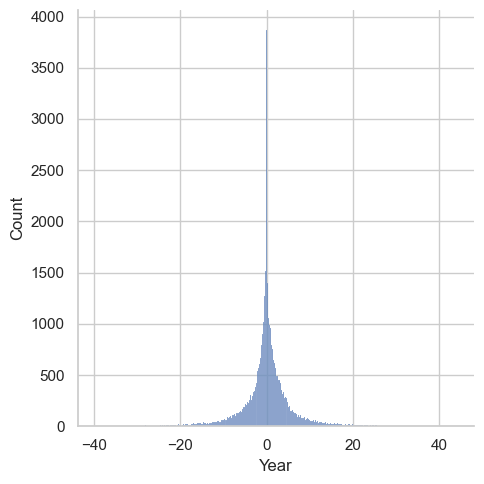

In [111]:
print(sns.scatterplot(y_test))
print(sns.displot(y_test-pred))

In [19]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Create KNN classifier
knn = KNeighborsClassifier()
# Train KNN classifier
knn.fit(X_train, y_train)
# Use the trained model for prediction
y_pred = knn.predict(X_test)

print(f'Training Accuracy of KNN is {accuracy_score(y_train, knn.predict(X_train))}\n')

# Calculate evaluation indicators
knn_accuracy = accuracy_score(y_test, y_pred)
knn_precision = precision_score(y_test, y_pred, average='macro')
knn_recall = recall_score(y_test, y_pred, average='macro')
knn_f1_score = f1_score(y_test, y_pred, average='macro')

print(f"Confusion Matrix: \n{confusion_matrix(y_test, y_pred)}\n")
print(f"Test Accuracy of KNN is {knn_accuracy} \n")
print(f"Test Precision of KNN is {knn_precision} \n")
print(f"Test Recall of KNN is {knn_recall} \n")
print(f"Test F1_score of KNN is {knn_f1_score} \n")
print(f"Classification Report: \n {classification_report(y_test, y_pred)}")

ValueError: could not convert string to float: 'Iraq'

Axes(0.125,0.11;0.775x0.77)


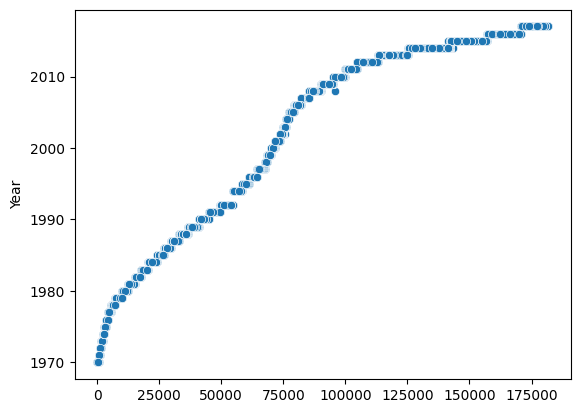

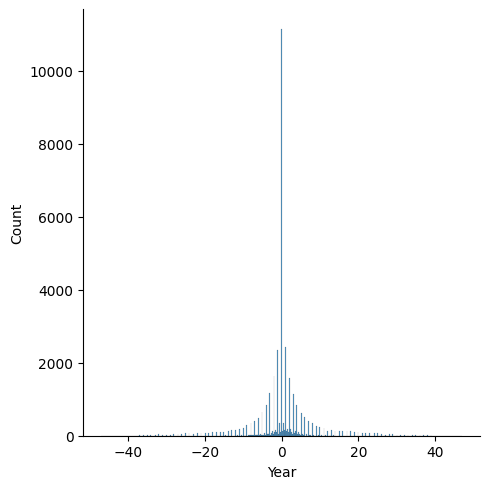

In [20]:
print(sns.scatterplot(y_test))
print(sns.displot(y_test-pred))

In [21]:
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()
gnb.fit(X_train, y_train)
y_pred = gnb.predict(X_test)

print(f'Training Accuracy of Gaussian Naive Bayes is {accuracy_score(y_train, gnb.predict(X_train))}\n')

gnb_accuracy = accuracy_score(y_test, y_pred)
gnb_precision = precision_score(y_test, y_pred, average='macro')
gnb_recall = recall_score(y_test, y_pred, average='macro')
gnb_f1_score = f1_score(y_test, y_pred, average='macro')

print(f"Confusion Matrix: \n{confusion_matrix(y_test, y_pred)}\n")
print(f"Test Accuracy of Gaussian Naive Bayes is {gnb_accuracy} \n")
print(f"Test Precision of Gaussian Naive Bayes is {gnb_precision} \n")
print(f"Test Recall of Gaussian Naive Bayes is {gnb_recall} \n")
print(f"Test F1_score of Gaussian Naive Bayes is {gnb_f1_score} \n")
print(f"Classification Report: \n{classification_report(y_test, y_pred)}")

ValueError: could not convert string to float: 'Iraq'

Axes(0.125,0.11;0.775x0.77)


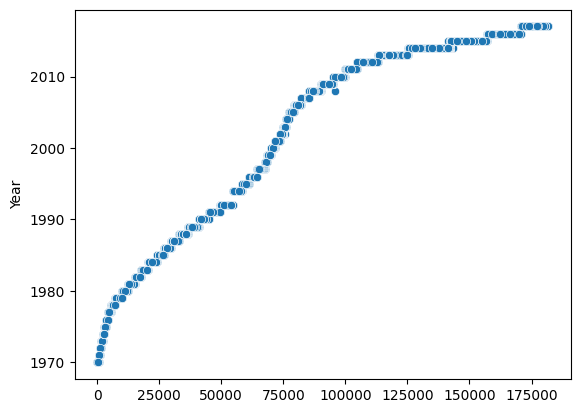

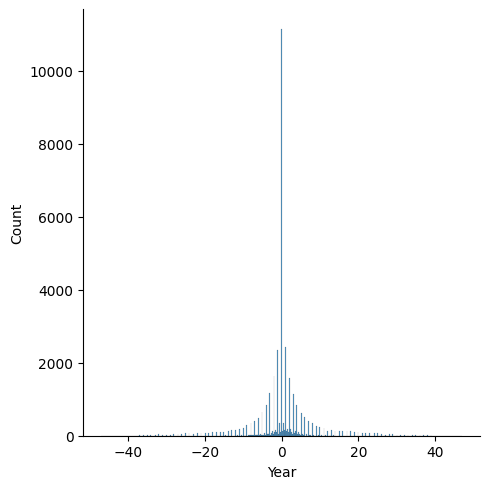

In [22]:
print(sns.scatterplot(y_test))
print(sns.displot(y_test-pred))